Problem Statement:
Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

In [90]:
# Importing required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [91]:
# Loading the dataset
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


#### Statistical Information of DataSet

In [92]:
df.shape

(8425, 23)

- we have 8425 rows and 23 columns

In [93]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

- we have combination of both Object and float type data

In [94]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8350.000000,8365.000000,8185.000000,4913.000000,4431.000000,7434.000000,8349.000000,8318.000000,8366.000000,8323.000000,7116.000000,7113.000000,6004.000000,5970.000000,8369.000000,8329.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.403596,6.136408,10.459379,5.044484,3.896235,14.665721,10.174579,9.766986,16.833283,18.423774,6.828699,6.766681,2.877658,2.731659,5.627035,5.980020
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.200000,19.300000,0.000000,2.600000,4.750000,30.000000,6.000000,11.000000,56.000000,39.000000,1013.000000,1010.400000,1.000000,2.000000,13.800000,18.000000
50%,13.300000,23.300000,0.000000,4.600000,8.700000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.800000,21.900000
75%,17.400000,28.000000,1.000000,7.000000,10.700000,50.000000,20.000000,24.000000,80.000000,63.000000,1022.300000,1019.800000,7.000000,7.000000,21.900000,26.400000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


#### Checking/visualizing for the null values

In [95]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

<AxesSubplot:>

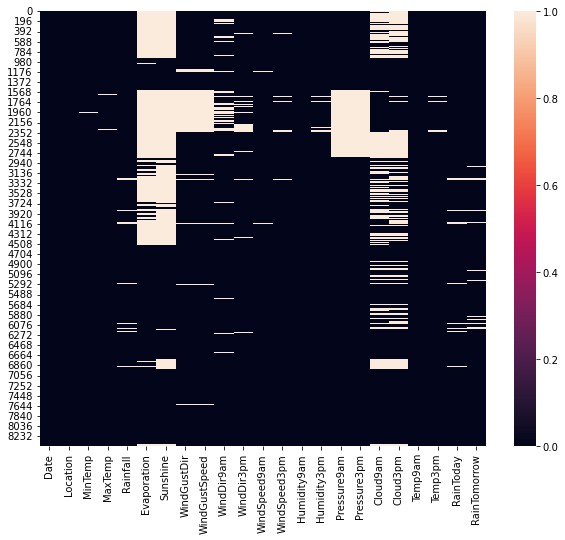

In [96]:
plt.figure(figsize=(10,8))
sns.heatmap(df.isnull())

- Every feature is having Null values except date,location

#### Getting all object type unique values

In [97]:
features_list = []
for feature_type in df.dtypes.index:
    if df.dtypes[feature_type]=='object':
        features_list.append(feature_type)
features_list

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

- We have 7 features of object types
    * Date
    * Location
    * WindGustDir
    * WindDir9am
    * WindDir3pm
    * RainToday
    * RainTomorrow

In [98]:
for feature in features_list:
    print(feature)
    print(df[feature].value_counts())
    print('--------------------------------------')

Date
2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
2011-05-18    5
2011-05-17    5
2011-05-16    5
2011-05-15    5
2011-05-14    5
2011-05-13    5
2011-05-12    5
2011-05-11    5
2011-05-10    5
2011-05-09    5
2011-05-07    5
2011-05-23    5
2011-05-06    5
2011-05-05    5
2011-05-04    5
2011-05-03    5
2011-05-02    5
2011-05-01    5
2011-03-31    5
2011-03-30    5
2011-03-29    5
2011-03-28    5
2011-03-27    5
2011-03-26    5
2011-03-25    5
2011-05-22    5
2011-05-24    5
2011-03-23    5
2011-06-10    5
2011-06-23    5
2011-06-22    5
2011-06-21    5
2011-06-20    5
2011-06-19    5
2011-06-18    5
2011-06-17    5
2011-06-16    5
2011-06-15    5
2011-06-14    5
2011-06-13    5
2011-06-12    5
2011-06-11    5
2011-06-09    5
2011-05-25    5
2011-06-08    5
2011-06-06    5
2011-06-05    5
2011-06-04    5
2011-06-03    5
2011-06-02    5
2011-06-01    5
2011-05-31    5
2011-05-30    5
2011-05-29    5
2011-05-28    5
2011-05-27    5
2011-05-26    5
201

In [99]:
num_features_list = []
for feature_type in df.dtypes.index:
    if df.dtypes[feature_type]=='float64':
        num_features_list.append(feature_type)
num_features_list

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [100]:
for feature in num_features_list:
    print(feature)
    print(df[feature].value_counts())
    print(f'The length of {feature} is {len(df[feature].value_counts())}')
    print('--------------------------------------')

MinTemp
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
 14.8    67
 10.8    66
 17.8    65
 13.3    64
 13.7    64
 10.0    63
 14.2    61
 16.1    61
 18.4    60
 13.0    60
 18.7    59
 11.4    59
 15.6    59
 10.5    59
 11.8    58
 13.6    58
 14.5    58
 18.5    57
 16.3    57
 10.1    57
 9.5     57
 10.7    57
 12.1    57
 17.5    56
 8.0     56
 14.0    56
 9.0     56
 8.4     56
 14.4    54
 9.4     54
 18.8    54
 9.1     54
 10.2    54
 19.4    54
 8.9     54
 16.0    54
 12.8    54
 11.1    54
 11.5    54
 15.5    53
 15.9    53
 16.7    53
 18.2    53
 18.0    52
 17.1    52
 11.3    52
 8.2     51
 13.9    51
 11.2    51
 12.5    51
 15.1    51
 13.4    50
 13.5    50
 17.7    50
 17.2    50
 9.6     50
 12.3    49
 11.0    49
 19.3    49
 15.0    49
 16.5    48
 15.4    48
 8.8     47
 16.6    47
 14.9    47
 19.5    47
 6.0     47
 17.0    47
 19.0    46
 16.9    46
 10.3    46
 7.0     46
 9.8     46
 11.6    45
 10.4    45
 11.9    45
 12.2    45
 15.7   

#### Handling NAN Values

##### For float type

In [101]:
for i in df.columns:
    if df[i].dtypes == "float64":
        fet_mean = np.mean(df[i])
        df[i] = df[i].fillna(fet_mean)

##### For object type

In [102]:
features_list = []
for feature_type in df.dtypes.index:
    if df.dtypes[feature_type]=='object':
        features_list.append(feature_type)
features_list

['Date',
 'Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [103]:
for i in features_list:
    df[i] = df[i].fillna(df[i].mode()[0])

<AxesSubplot:>

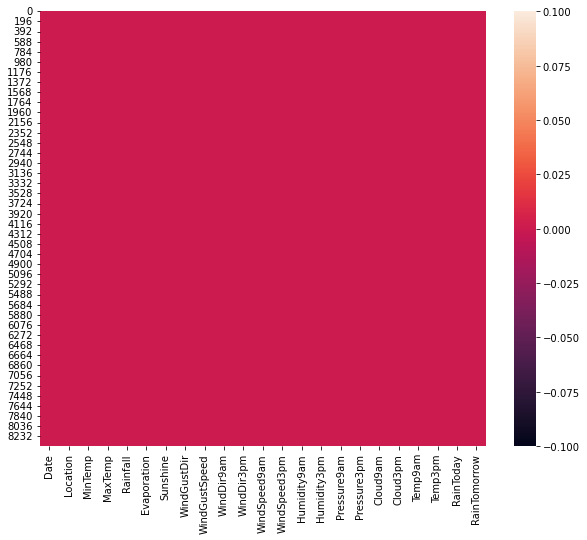

In [104]:
plt.figure(figsize=(10,8))
sns.heatmap(df.isnull())

- All the Null values are removed from the Dataset

In [105]:
df.head(3)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No


### Visualization

#### Univariate Analaysis for categeorical columns

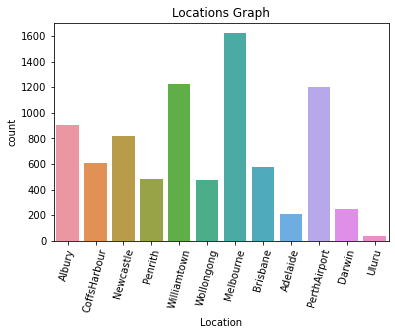

In [106]:
# Location feature
sns.countplot(df['Location'])
plt.title('Locations Graph')
plt.xticks(rotation=75)
plt.show()

- We have highest rainfall data from melbourne and lest rainfall from Uluru

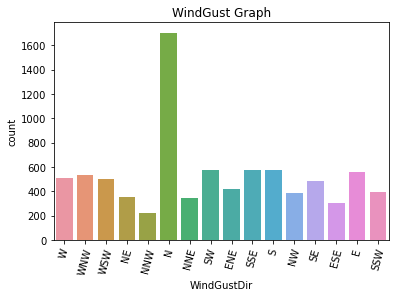

In [107]:
# WindGustDir feature
sns.countplot(df['WindGustDir'])
plt.title('WindGust Graph')
plt.xticks(rotation=75)
plt.show()

- wind gust was very heavy in the north region
- Very less in NNW

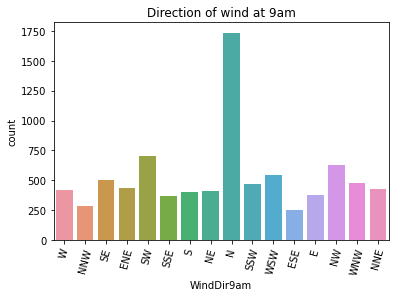

In [108]:
# WindDir9am feature
sns.countplot(df['WindDir9am'])
plt.title('Direction of wind at 9am')
plt.xticks(rotation=75)
plt.show()

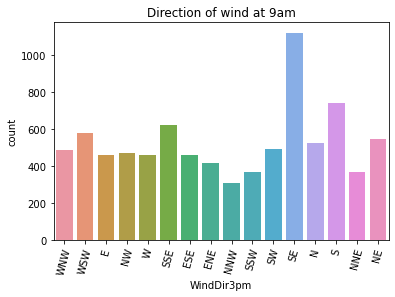

In [109]:
# WindDir3pm feature
sns.countplot(df['WindDir3pm'])
plt.title('Direction of wind at 9am')
plt.xticks(rotation=75)
plt.show()

- In the above above 2 plots we can see that wind direction fo rboth 9am and 3 pm is towards North

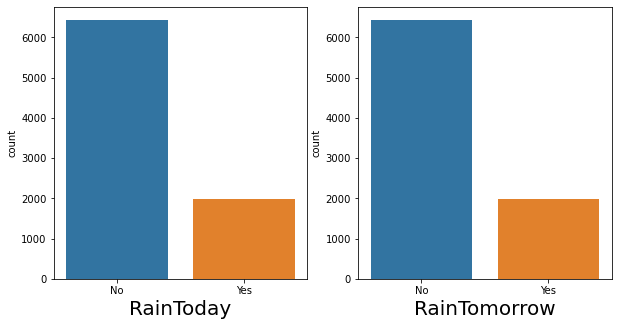

In [110]:
# RainToday, RainTomorrow Features
plt.figure(figsize=(10,5),facecolor='white')
cat_ftrs = ['RainToday','RainTomorrow']
pltnum=1
for feature in cat_ftrs:
    plt.subplot(1,2,pltnum)
    sns.countplot(df[feature])
    plt.xlabel(feature,fontsize=20)
    pltnum+=1
plt.show()

- RainToday and RainTommorow has no difference

#### Visulization of the distribution of the Numerical features

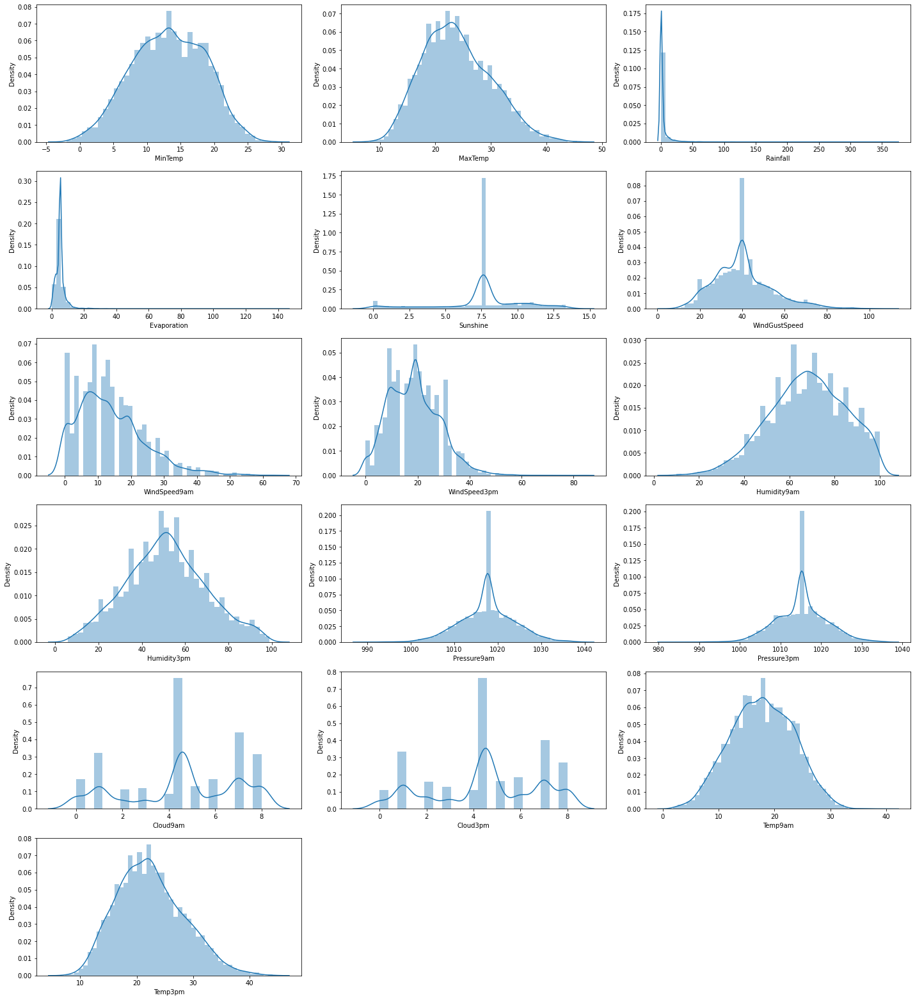

In [111]:
plt.figure(figsize=(20,25),facecolor='white')
plotnum=1
for ftrs in num_features_list:
    if plotnum<=20:
        ax = plt.subplot(7,3,plotnum)
        sns.distplot(df[ftrs])
        plt.xlabel(ftrs,fontsize=10)
        plt.yticks(rotation=0,fontsize=10)
    plotnum+=1
plt.tight_layout()

- Data is not Normally Distributed
    * MaxTemp is little right skewed
    * MinTemp is normally distributed
    * Rainfall,Evaporation features is left skewed
    * Sunshine feature is not normally distributed and is flowing both sides
    * WindGustSpeed, WindSpeed9am,Windspeed3pm has bimodal distribution
    * Humidity9am graph is little right skewed
    * Humidity3pm is normally distributed
    * Pressure9am, Pressure3pm data is normally distributed
    * Cloud9am,Cloud3pm has multi modal distribution
    * Temp9amm, Temp3pm has data normally ditributed

#### Bivariate Analaysis

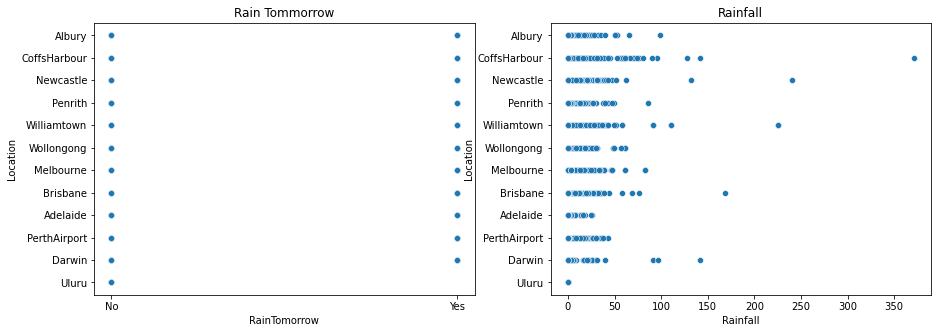

In [112]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title('Rain Tommorrow')
sns.scatterplot(x='RainTomorrow',y='Location',data=df)
plt.subplot(1,2,2)
plt.title('Rainfall')
sns.scatterplot(x='Rainfall',y='Location',data=df)
plt.show()

- We can see that Location doesnot have any major impact

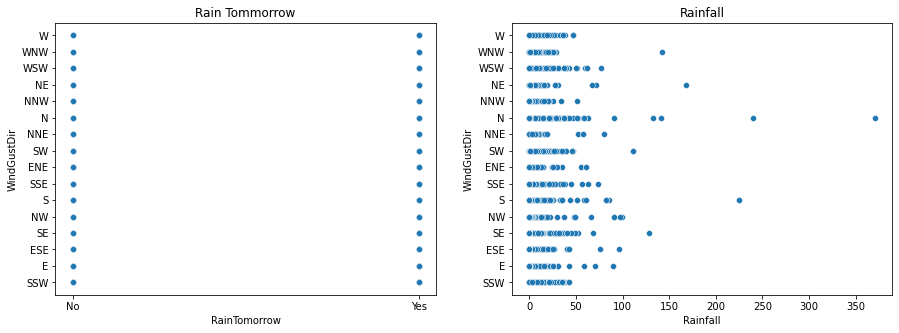

In [113]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title('Rain Tommorrow')
sns.scatterplot(x='RainTomorrow',y='WindGustDir',data=df)
plt.subplot(1,2,2)
plt.title('Rainfall')
sns.scatterplot(x='Rainfall',y='WindGustDir',data=df)
plt.show()

<AxesSubplot:xlabel='WindDir3pm', ylabel='Rainfall'>

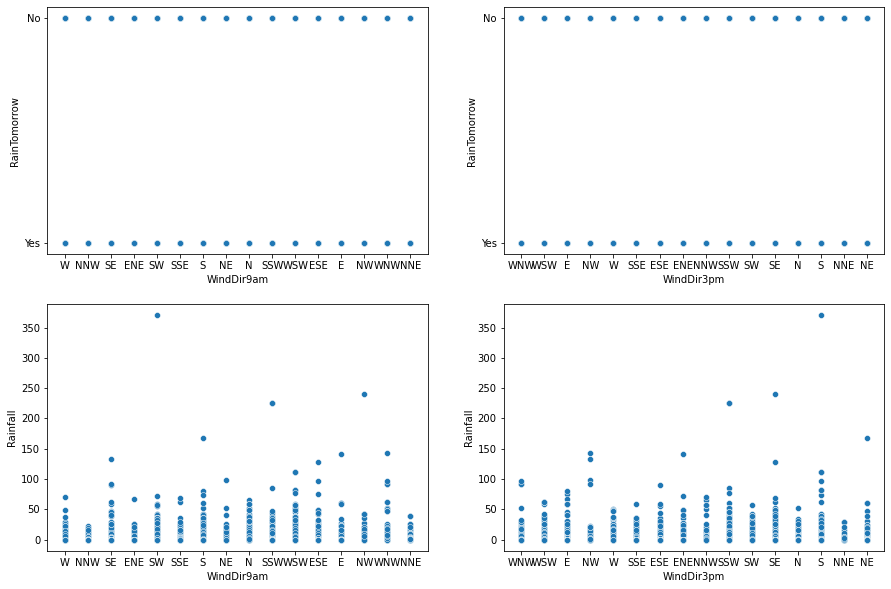

In [114]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w WindDir9am and RainTomorrow
sns.scatterplot(x='WindDir9am', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w WindDir3pm and RainTomorrow
sns.scatterplot(x='WindDir3pm', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w WindDir9am and Rainfall
sns.scatterplot(x='WindDir9am', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w WindDir3pm and Rainfall
sns.scatterplot(x='WindDir3pm', y='Rainfall',ax = axes[1,1], data=df)

- No linear relationship with target

<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

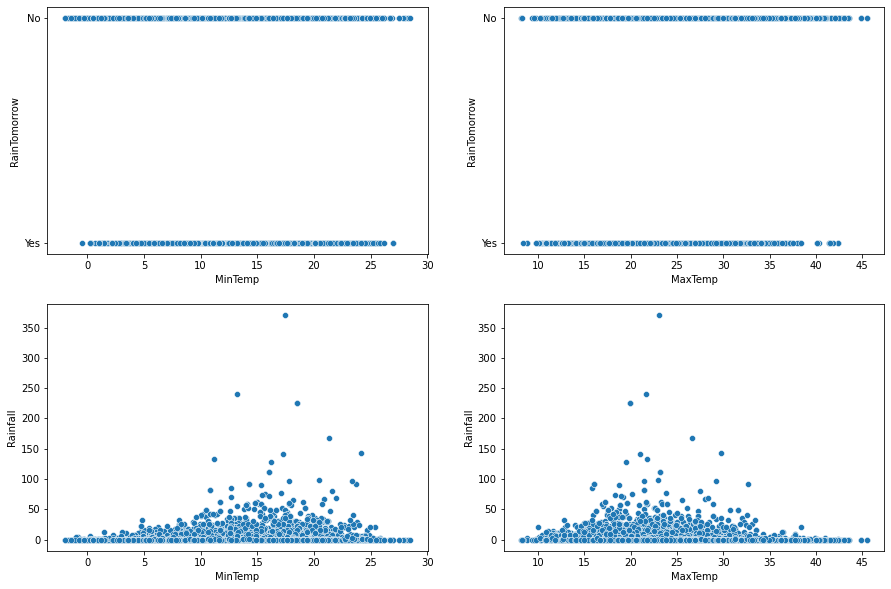

In [115]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w MinTemp and RainTomorrow
sns.scatterplot(x='MinTemp', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w MaxTemp and RainTomorrow
sns.scatterplot(x='MaxTemp', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w MinTemp and Rainfall
sns.scatterplot(x='MinTemp', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w MaxTemp and Rainfall
sns.scatterplot(x='MaxTemp', y='Rainfall',ax = axes[1,1], data=df)

- No linear relationship with target

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

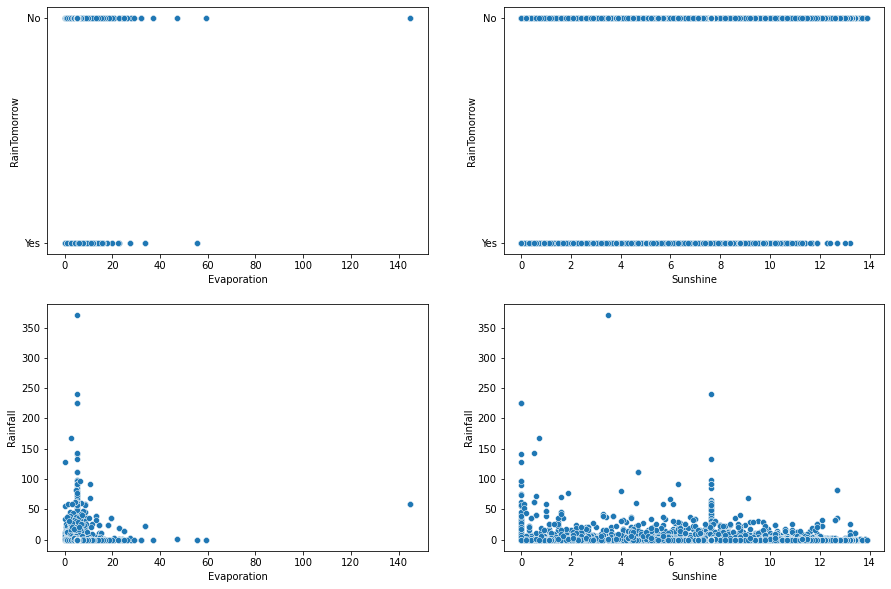

In [116]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w Evaporation and RainTomorrow
sns.scatterplot(x='Evaporation', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w Sunshine and RainTomorrow
sns.scatterplot(x='Sunshine', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w Evaporation and Rainfall
sns.scatterplot(x='Evaporation', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w Sunshine and Rainfall
sns.scatterplot(x='Sunshine', y='Rainfall',ax = axes[1,1], data=df)

- There is relationship present between. the feature and target

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

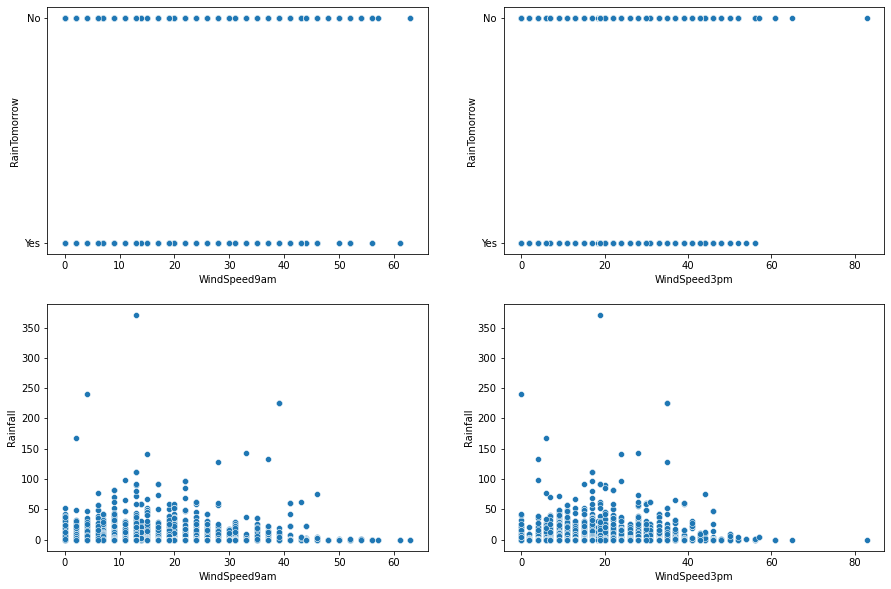

In [117]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w WindSpeed9am and RainTomorrow
sns.scatterplot(x='WindSpeed9am', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w WindSpeed3pm and RainTomorrow
sns.scatterplot(x='WindSpeed3pm', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w WindSpeed9am and Rainfall
sns.scatterplot(x='WindSpeed9am', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w WindSpeed3pm and Rainfall
sns.scatterplot(x='WindSpeed3pm', y='Rainfall',ax = axes[1,1], data=df)



<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

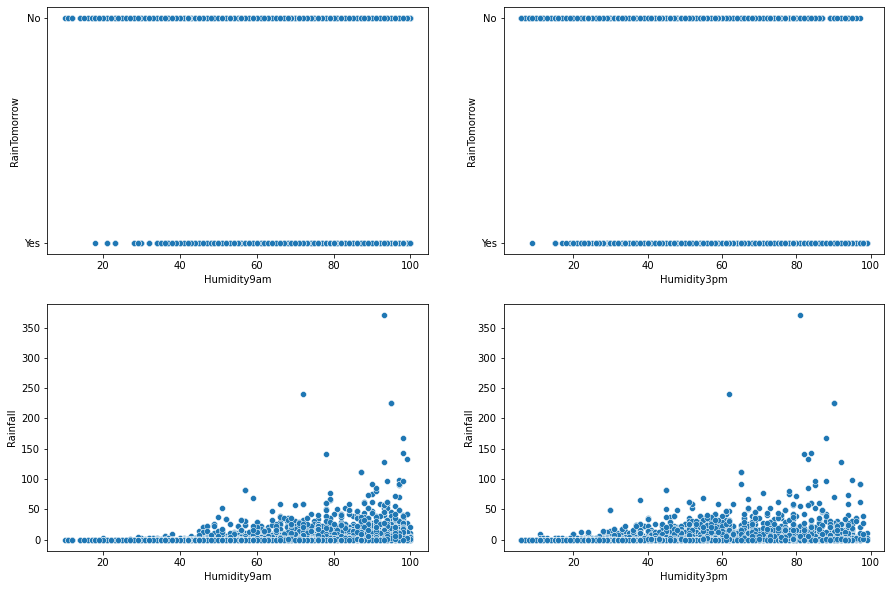

In [118]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w Humidity9am and RainTomorrow
sns.scatterplot(x='Humidity9am', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w Humidity3pm and RainTomorrow
sns.scatterplot(x='Humidity3pm', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w Humidity9am and Rainfall
sns.scatterplot(x='Humidity9am', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w Humidity3pm and Rainfall
sns.scatterplot(x='Humidity3pm', y='Rainfall',ax = axes[1,1], data=df)

- There is inverse relation in humidity and RainTomorrow
- we have positive relationshipp between humidity and rainfall

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

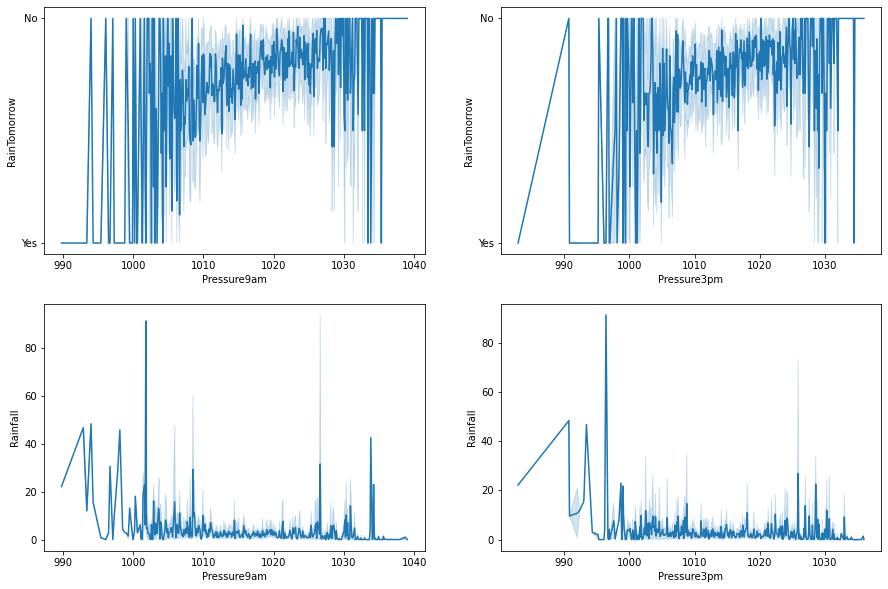

In [119]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w Pressure9am and RainTomorrow
sns.lineplot(x='Pressure9am', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w Pressure3pm and RainTomorrow
sns.lineplot(x='Pressure3pm', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w Pressure9am and Rainfall
sns.lineplot(x='Pressure9am', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w Pressure3pm and Rainfall
sns.lineplot(x='Pressure3pm', y='Rainfall',ax = axes[1,1], data=df)

- No Linear relationship

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

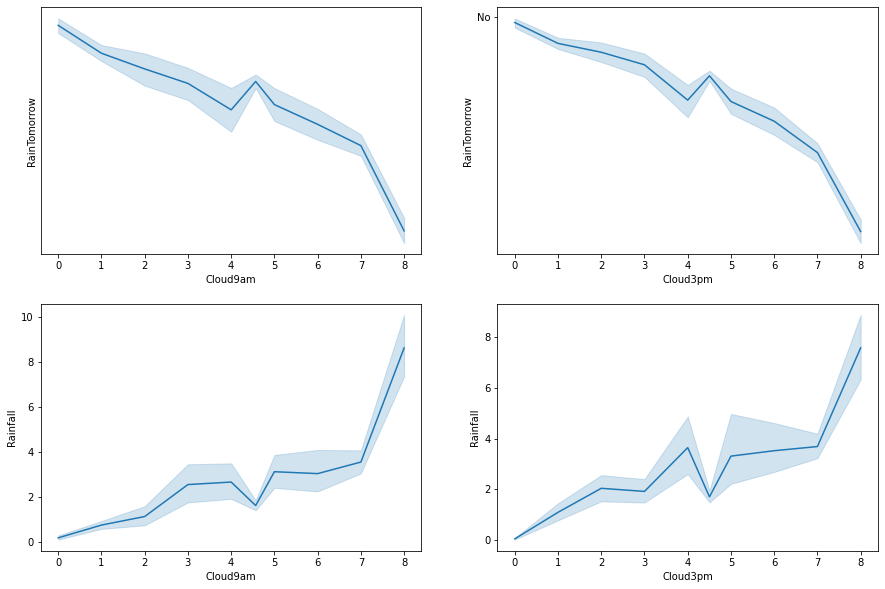

In [120]:
fig,axes = plt.subplots(2,2,figsize=(15,10))
#Checking the relation b/w Cloud9am and RainTomorrow
sns.lineplot(x='Cloud9am', y='RainTomorrow',ax = axes[0,0], data=df)
#Checking the relation b/w Cloud3pm and RainTomorrow
sns.lineplot(x='Cloud3pm', y='RainTomorrow',ax = axes[0,1], data=df)
#Checking the relation b/w Cloud9am and Rainfall
sns.lineplot(x='Cloud9am', y='Rainfall',ax = axes[1,0], data=df)
#Checking the relation b/w Cloud3pm and Rainfall
sns.lineplot(x='Cloud3pm', y='Rainfall',ax = axes[1,1], data=df)

### Outlier Detection

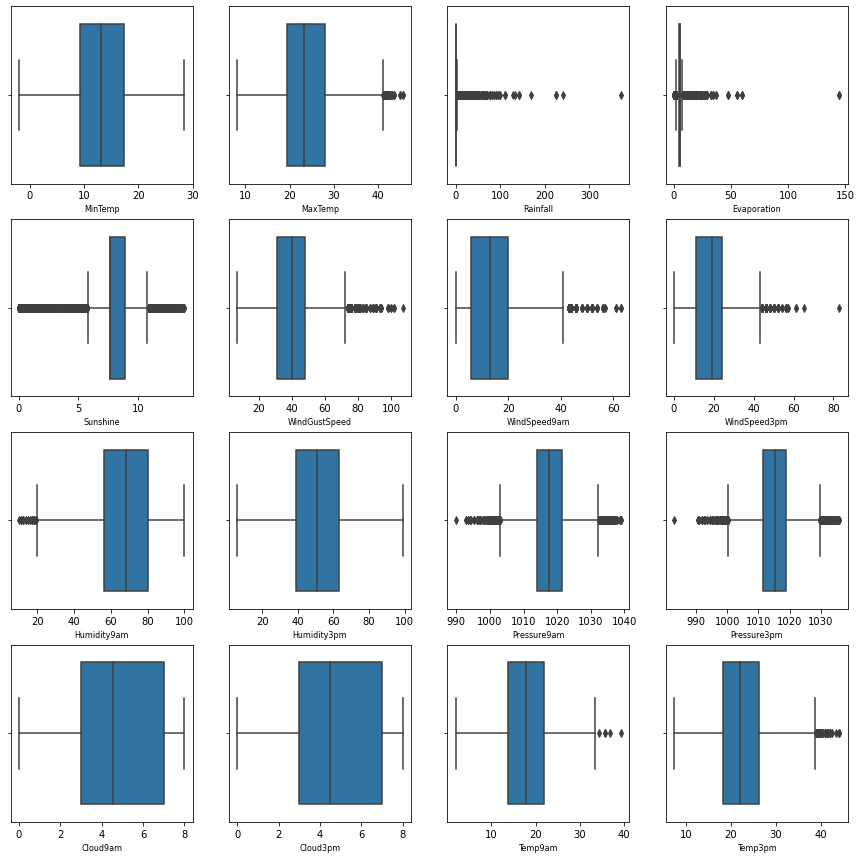

In [121]:
plt.figure(figsize=(15,15),facecolor='white')
plotnum=1
for col in num_features_list:
    if plotnum<=16:
        plt.subplot(4,4,plotnum)
        sns.boxplot(df[col])
        plt.xlabel(col,fontsize=8)
    plotnum+=1
plt.show()

- we have outliers in
    * MaxTemp
    * Rainfall
    * Evaporation
    * Sunshine
    * WindGustSpeed
    * WindSpeed9am
    * WindSpeed3pm
    * Humidity9am
    * Pressure9am
    * Pressure3pm
    * Temp3pm

#### removal of outliers

In [122]:
# Applying z-score method
df_2 = df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Pressure3pm']]
from scipy.stats import zscore
zscore_abs = np.abs(zscore(df_2))
#THreshold is taken as +3/-3
zdf = df_2[(zscore_abs < 3).all(axis=1)]

In [123]:
zdf.shape

(7997, 11)

In [124]:
df.shape

(8425, 23)

In [125]:
print('The data loss after using z-score method is ',(8425-7997)/8425 * 100)


The data loss after using z-score method is  5.080118694362018


In [126]:
# Using IQR method
# Creating a function to remove outlier
"""Takes the dataframe and removed the outliers and will return back"""
outlier_index = np.array([])
for column in df_2:
    q1 = df_2[column].quantile(0.25)
    q3 = df_2[column].quantile(0.75)
    IQR = q3-q1
    col = df_2[column]
    indx = col[(col > q3+1.5*IQR) | (col < q1-1.5*IQR)].index
    outlier_index = np.append(outlier_index,indx)
outlier_index

array([  44.,   59.,   60., ..., 8422., 8423., 8424.])

In [127]:
df_2 = df_2.drop(outlier_index)
df_2.shape

(0, 11)

- Going ahed with zscore method

In [128]:
dropindx = df.index.difference(zdf.index)
df.drop(dropindx,inplace=True)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.400000,22.900000,0.600000,5.389395,7.632205,W,44.000000,W,...,71.000000,22.00000,1007.700000,1007.100000,8.000000,4.503183,16.900000,21.800000,No,No
1,2008-12-02,Albury,7.400000,25.100000,0.000000,5.389395,7.632205,WNW,44.000000,NNW,...,44.000000,25.00000,1010.600000,1007.800000,4.566622,4.503183,17.200000,24.300000,No,No
2,2008-12-03,Albury,12.900000,25.700000,0.000000,5.389395,7.632205,WSW,46.000000,W,...,38.000000,30.00000,1007.600000,1008.700000,4.566622,2.000000,21.000000,23.200000,No,No
3,2008-12-04,Albury,9.200000,28.000000,0.000000,5.389395,7.632205,NE,24.000000,SE,...,45.000000,16.00000,1017.600000,1012.800000,4.566622,4.503183,18.100000,26.500000,No,No
4,2008-12-05,Albury,17.500000,32.300000,1.000000,5.389395,7.632205,W,41.000000,ENE,...,82.000000,33.00000,1010.800000,1006.000000,7.000000,8.000000,17.800000,29.700000,No,No
5,2008-12-06,Albury,14.600000,29.700000,0.200000,5.389395,7.632205,WNW,56.000000,W,...,55.000000,23.00000,1009.200000,1005.400000,4.566622,4.503183,20.600000,28.900000,No,No
6,2008-12-07,Albury,14.300000,25.000000,0.000000,5.389395,7.632205,W,50.000000,SW,...,49.000000,19.00000,1009.600000,1008.200000,1.000000,4.503183,18.100000,24.600000,No,No
7,2008-12-08,Albury,7.700000,26.700000,0.000000,5.389395,7.632205,W,35.000000,SSE,...,48.000000,19.00000,1013.400000,1010.100000,4.566622,4.503183,16.300000,25.500000,No,No
8,2008-12-09,Albury,9.700000,31.900000,0.000000,5.389395,7.632205,NNW,80.000000,SE,...,42.000000,9.00000,1008.900000,1003.600000,4.566622,4.503183,18.300000,30.200000,No,Yes
9,2008-12-10,Albury,13.100000,30.100000,1.400000,5.389395,7.632205,W,28.000000,S,...,58.000000,27.00000,1007.000000,1005.700000,4.566622,4.503183,20.100000,28.200000,Yes,No


### Checking for skewness

In [129]:
df.skew()

MinTemp         -0.083031
MaxTemp          0.331087
Rainfall         3.490984
Evaporation      0.854300
Sunshine        -0.723885
WindGustSpeed    0.507909
WindSpeed9am     0.711266
WindSpeed3pm     0.301919
Humidity9am     -0.230824
Humidity3pm      0.119488
Pressure9am      0.019072
Pressure3pm      0.042339
Cloud9am        -0.357078
Cloud3pm        -0.266472
Temp9am         -0.030603
Temp3pm          0.353778
dtype: float64

- We have skewness in Sunshine,rainfall,Evaporation,Windspeed9am,Windgustspeed

#### Using Log Transformation to remove skewness

In [130]:
df['Sunshine'] = np.log1p(df['Sunshine'])
df['Rainfall'] = np.log1p(df['Rainfall'])
df['Evaporation'] = np.log1p(df['Evaporation'])
df['WindSpeed9am'] = np.log1p(df['WindSpeed9am'])
df['WindGustSpeed'] = np.log1p(df['WindGustSpeed'])

In [131]:
df.skew()

MinTemp         -0.083031
MaxTemp          0.331087
Rainfall         1.664396
Evaporation     -0.989790
Sunshine        -2.462072
WindGustSpeed   -0.525023
WindSpeed9am    -1.187708
WindSpeed3pm     0.301919
Humidity9am     -0.230824
Humidity3pm      0.119488
Pressure9am      0.019072
Pressure3pm      0.042339
Cloud9am        -0.357078
Cloud3pm        -0.266472
Temp9am         -0.030603
Temp3pm          0.353778
dtype: float64

#### Label encoding for categeorical features

In [132]:
from sklearn.preprocessing import LabelEncoder
cat_features = ['RainToday','RainTomorrow']
le = LabelEncoder()
for i in cat_features:
    df[i] = le.fit_transform(df[i])

In [133]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.400000,22.900000,0.470004,1.854640,2.155500,W,3.806662,W,...,71.000000,22.00000,1007.700000,1007.100000,8.000000,4.503183,16.900000,21.800000,0,0
1,2008-12-02,Albury,7.400000,25.100000,0.000000,1.854640,2.155500,WNW,3.806662,NNW,...,44.000000,25.00000,1010.600000,1007.800000,4.566622,4.503183,17.200000,24.300000,0,0
2,2008-12-03,Albury,12.900000,25.700000,0.000000,1.854640,2.155500,WSW,3.850148,W,...,38.000000,30.00000,1007.600000,1008.700000,4.566622,2.000000,21.000000,23.200000,0,0
3,2008-12-04,Albury,9.200000,28.000000,0.000000,1.854640,2.155500,NE,3.218876,SE,...,45.000000,16.00000,1017.600000,1012.800000,4.566622,4.503183,18.100000,26.500000,0,0
4,2008-12-05,Albury,17.500000,32.300000,0.693147,1.854640,2.155500,W,3.737670,ENE,...,82.000000,33.00000,1010.800000,1006.000000,7.000000,8.000000,17.800000,29.700000,0,0
5,2008-12-06,Albury,14.600000,29.700000,0.182322,1.854640,2.155500,WNW,4.043051,W,...,55.000000,23.00000,1009.200000,1005.400000,4.566622,4.503183,20.600000,28.900000,0,0
6,2008-12-07,Albury,14.300000,25.000000,0.000000,1.854640,2.155500,W,3.931826,SW,...,49.000000,19.00000,1009.600000,1008.200000,1.000000,4.503183,18.100000,24.600000,0,0
7,2008-12-08,Albury,7.700000,26.700000,0.000000,1.854640,2.155500,W,3.583519,SSE,...,48.000000,19.00000,1013.400000,1010.100000,4.566622,4.503183,16.300000,25.500000,0,0
8,2008-12-09,Albury,9.700000,31.900000,0.000000,1.854640,2.155500,NNW,4.394449,SE,...,42.000000,9.00000,1008.900000,1003.600000,4.566622,4.503183,18.300000,30.200000,0,1
9,2008-12-10,Albury,13.100000,30.100000,0.875469,1.854640,2.155500,W,3.367296,S,...,58.000000,27.00000,1007.000000,1005.700000,4.566622,4.503183,20.100000,28.200000,1,0


#### using One hot encoder for other cat values

In [134]:
cat_fets = ['Location','WindGustDir','WindDir9am','WindDir3pm']
for i in cat_fets:
    dummies = pd.get_dummies(df[i])
    df = pd.concat([df,dummies],axis=1)
    df.drop(i,axis=1,inplace=True)

In [ ]:
df

#### Feature Engineering
##### As date feature should of int type we have it as object type so need to convert it 

In [ ]:
df['Date']  =pd.to_datetime(df['Date'])

In [ ]:
df.info()

In [ ]:
# Extracting day from Date feature
df['Day'] = pd.to_datetime(df.Date,format="%d/%m/%y").dt.day
# Extracting month from Date feature
df['Month'] = pd.to_datetime(df.Date,format="%d/%m/%y").dt.month
# Extracting year from Date feature
df['Year'] = pd.to_datetime(df.Date,format="%d/%m/%y").dt.year

#### as we converted Date feature into numerical other features dropping main feature

In [ ]:
df.drop(columns=['Date'],axis=1,inplace=True)

#### Finding the correlation

In [ ]:
plt.figure(figsize=(50,50))
sns.heatmap(df.corr(),annot=True,cmap='RdBu',vmin=-1,vmax=+1,linewidths=2)
plt.show()

In [ ]:
plt.figure(figsize=(15,8))
df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar')

In [ ]:
df

#### Standardization

In [ ]:
x = df.drop('RainTomorrow',axis=1)
y = df['RainTomorrow']

In [ ]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
scaled_x = scalar.fit_transform(x)

### Using Variation inflation factor for checking multicollinearity

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_VIF(scaled_x):
    #Calculating VIF
    vif = pd.DataFrame()
    vif['Features'] = x.columns
    vif['VIF'] = [variance_inflation_factor(scaled_x,i) for i in range(scaled_x.shape[1])]
    return vif
vif = calc_VIF(scaled_x)

In [ ]:
pd.set_option('display.max_rows', None)
vif

- There is high collinearity with 
    * MaxTemp
    * Pressure9am
    * Pressure3pm
    * Temp9am
    * Temp3pm

#### Dropping high collinearity features

In [ ]:
x_best = df.drop(columns=['MaxTemp','Pressure9am','Pressure3pm','Temp9am','Temp3pm'],axis=1,inplace=True)
x_best

In [ ]:
#df.shape

#### Oversampling

In [ ]:
#y.value_counts()

- we can clearly see the data is imbalnced

#### Handling the imbalance of data using smote technique

In [ ]:
#from imblearn.over_sampling import SMOTE as se
#x,y = se().fit_resample(scaled_x_best,y)